<a href="https://colab.research.google.com/github/Jain-Nishkarsh/SUTT_AI-ML_Task/blob/main/SUTT_AI_ML_Model.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [516]:
import torch
import pandas as pd
import numpy as np
from matplotlib import pyplot as plt
import seaborn as sns

device = "cuda" if torch.cuda.is_available() else "cpu"
%load_ext tensorboard

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard


In [471]:
from torch.utils.tensorboard import SummaryWriter
writer = SummaryWriter()

In [472]:
data = pd.read_csv("/content/GPL_final_data.csv", index_col = 0)
display(data)

,SEX,ATTENDS LECTURES,CHARACTER,GRAMS / MONTH,ADMISSION_MODE_BITSAT,ADMISSION_MODE_DASA,BOARD_STUDIED_CBSE,BOARD_STUDIED_ICSE,exactly 18yo,CompiledCGPA,CLUB/DEPARTMENT_0,CLUB/DEPARTMENT_1,CLUB/DEPARTMENT_2,CLUB/DEPARTMENT_3,CLUB/DEPARTMENT_4,GPL
0,1,0,1,0.447005,1,0,1,0,0,1.028072,1,0,0,0,0,0
1,0,0,0,0.004608,0,1,0,1,0,1.085387,1,0,0,0,0,1
2,0,0,0,0.013825,1,0,1,0,0,-0.709288,1,0,0,0,0,1
3,0,0,0,0.004608,0,1,1,0,0,-0.045859,1,0,0,0,0,1
4,1,0,1,0.769585,1,0,1,0,0,0.598210,1,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
1092,1,0,0,0.345622,0,0,1,0,0,-1.418560,1,0,0,0,0,0
1093,0,0,0,0.013825,0,0,1,0,0,-1.221540,1,0,0,0,0,1
1094,0,1,1,0.483871,1,0,1,0,0,-1.529608,0,1,0,0,0,0
1095,1,0,0,0.788018,0,1,1,0,0,0.608957,1,0,0,0,0,0


In [473]:
X = data.iloc[:,:15].to_numpy()
Y = data['GPL'].to_numpy()

X = torch.from_numpy(X).type(torch.float)
Y = torch.from_numpy(Y).type(torch.float)

In [474]:
# Test train split
testize = 0.2

from sklearn.model_selection import train_test_split

X_train, X_test, Y_train, Y_test = train_test_split(X, Y, test_size=testize)

In [475]:
# HYPERPARAMETERS
torch.manual_seed(7)

alpha = 0.01
epochs = 3000

In [476]:
from torch import nn

class GPLClassifier(nn.Module):
    def __init__(self):
        super().__init__()
        self.X = nn.Linear(in_features = 15, out_features = 64)
        self.hidden = nn.Linear(in_features=64, out_features=64)
        self.hidden2 = nn.Linear(in_features=64, out_features=64)
        self.Y = nn.Linear(in_features = 64, out_features = 1)
        self.relu = nn.ReLU()

    def forward(self, x):
        return self.Y(self.relu(self.hidden2(self.relu(self.hidden(self.X(x))))))

model = GPLClassifier().to(device)
model

GPLClassifier(
  (X): Linear(in_features=15, out_features=64, bias=True)
  (hidden): Linear(in_features=64, out_features=64, bias=True)
  (hidden2): Linear(in_features=64, out_features=64, bias=True)
  (Y): Linear(in_features=64, out_features=1, bias=True)
  (relu): ReLU()
)

In [487]:
#Binary cross entropy loss function good for binary classification
lossfunction = nn.BCEWithLogitsLoss()

#Adam good for Binary classification
optimizer = torch.optim.Adam(params = model.parameters(), lr=alpha)

In [478]:
def accuracy_fn(y, pred):
    correct = torch.eq(y, pred).sum().item()
    return (correct / len(pred)) * 100

In [479]:
results = { "train_losses" : [],
            "train_accuracy" : [],
            "test_losses" : [],
            "test_accuracy" : [] }

In [480]:
X_train, Y_train = X_train.to(device), Y_train.to(device)
X_test, Y_test = X_test.to(device), Y_test.to(device)
best_acc = 0
for epoch in range(epochs):
    model.train()

    y_logits = model(X_train).squeeze()
    y_pred = torch.round(torch.sigmoid(y_logits))

    loss = lossfunction(y_logits, Y_train)
    accuracy = accuracy_fn(Y_train, y_pred)

    optimizer.zero_grad()
    loss.backward()
    optimizer.step()

    model.eval()

    with torch.inference_mode():
        test_logits = model(X_test).squeeze()
        test_pred = torch.round(torch.sigmoid(test_logits))

        test_loss = lossfunction(test_logits, Y_test)
        test_accuracy = accuracy_fn(Y_test, test_pred)

    results["train_losses"].append(loss.item())
    results["train_accuracy"].append(accuracy)
    results["test_losses"].append(test_loss.item())
    results["test_accuracy"].append(test_accuracy)

    writer.add_scalars(main_tag = 'Loss',
                       tag_scalar_dict = {"train_loss" : loss,
                                          "test_loss" : test_loss},
                       global_step = epoch)

    writer.add_scalars(main_tag="Accuracy",
                       tag_scalar_dict={"train_acc": accuracy,
                                        "test_acc": test_accuracy},
                       global_step=epoch)

    # writer.add_graph( model = model,
    #                   input_to_model = torch.randn(32, 3, 224, 224).to(device) )

    if epoch % 10 == 0:
        print(f"Epoch: {epoch} | Loss: {loss:.5f}, Accuracy: {accuracy:.2f}% | Test loss: {test_loss:.5f}, Test acc: {test_accuracy:.2f}%")
        if test_accuracy > best_acc:
            best_acc = test_accuracy
            torch.save(model, "results/best.pt")

writer.close()

Epoch: 0 | Loss: 0.69379, Accuracy: 55.63% | Test loss: 0.65646, Test acc: 59.17%
Epoch: 10 | Loss: 0.22612, Accuracy: 92.30% | Test loss: 0.17458, Test acc: 93.12%
Epoch: 20 | Loss: 0.11318, Accuracy: 96.09% | Test loss: 0.09496, Test acc: 95.41%
Epoch: 30 | Loss: 0.09016, Accuracy: 96.55% | Test loss: 0.07386, Test acc: 96.79%
Epoch: 40 | Loss: 0.06815, Accuracy: 97.13% | Test loss: 0.05535, Test acc: 98.17%
Epoch: 50 | Loss: 0.06012, Accuracy: 98.05% | Test loss: 0.05563, Test acc: 98.17%
Epoch: 60 | Loss: 0.05155, Accuracy: 98.39% | Test loss: 0.05457, Test acc: 98.17%
Epoch: 70 | Loss: 0.04463, Accuracy: 98.16% | Test loss: 0.05168, Test acc: 98.17%
Epoch: 80 | Loss: 0.04601, Accuracy: 98.05% | Test loss: 0.05557, Test acc: 96.79%
Epoch: 90 | Loss: 0.03714, Accuracy: 98.62% | Test loss: 0.04905, Test acc: 97.71%
Epoch: 100 | Loss: 0.03490, Accuracy: 98.51% | Test loss: 0.05317, Test acc: 98.17%
Epoch: 110 | Loss: 0.03353, Accuracy: 98.39% | Test loss: 0.04011, Test acc: 97.25%
Epo

In [481]:
print("Test Acc: ", max(results['test_accuracy']))
print("Train Acc: ", max(results['train_accuracy']))

Test Acc:  99.08256880733946
Train Acc:  99.88505747126437


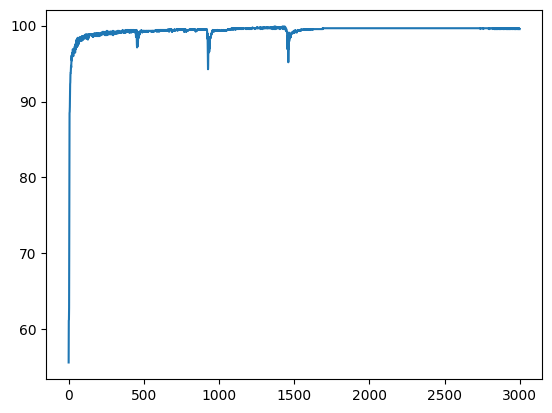

In [490]:
# Plotting Epoch vs Train Accuracy
plt.plot(results['train_accuracy'])

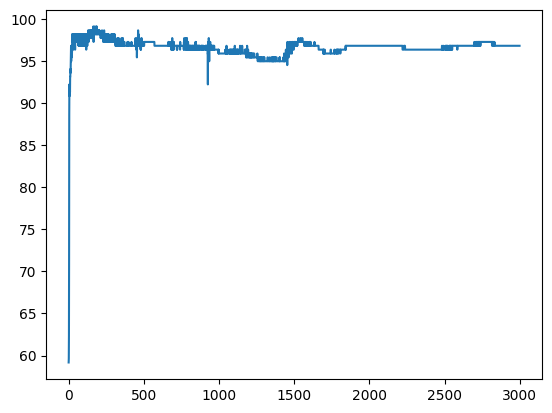

In [491]:
# Plotting Epoch vs Test Accuracy
plt.plot(results['test_accuracy'])

In [485]:
%tensorboard --logdir '/content/runs'

Reusing TensorBoard on port 6006 (pid 768), started 0:18:02 ago. (Use '!kill 768' to kill it.)

<IPython.core.display.Javascript object>

In [514]:
from sklearn.metrics import confusion_matrix

best_model = torch.load("results/best.pt")
y_best_pred = torch.round(torch.sigmoid((best_model(X_test).squeeze())))
cf_matrix = confusion_matrix(Y_test.cpu().detach().numpy(), y_best_pred.cpu().detach().numpy())

<Axes: >

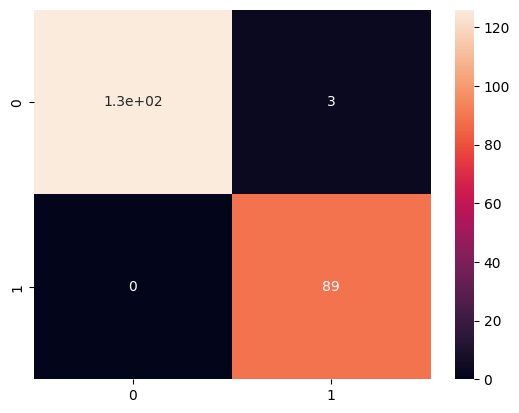

In [517]:
#Confusion matrix for values
sns.heatmap(cf_matrix, annot=True)

<Axes: >

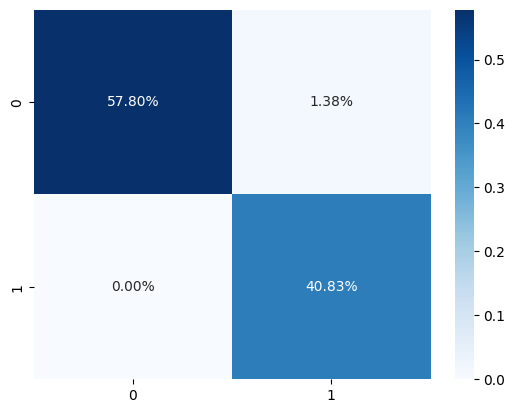

In [518]:
#Confusion matrix for percentages
sns.heatmap(cf_matrix/np.sum(cf_matrix), annot=True,
            fmt='.2%', cmap='Blues')